In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import pytesseract as pt
import plotly.express as px
import matplotlib.pyplot as plt
import xml.etree.ElementTree as xet

from glob import glob
from skimage import io
from shutil import copy
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [2]:
path = glob('/kaggle/input/license-plate-dataset/train/*.xml')
labels_dict = dict(filepath=[],xmin=[],xmax=[],ymin=[],ymax=[])

for filename in path:
    info = xet.parse(filename)
    root = info.getroot()

    for member_object in root.findall('object'):
        for labels_info in member_object.findall('bndbox'):
            xmin = int(labels_info.find('xmin').text)
            xmax = int(labels_info.find('xmax').text)
            ymin = int(labels_info.find('ymin').text)
            ymax = int(labels_info.find('ymax').text)

            labels_dict['filepath'].append(filename)
            labels_dict['xmin'].append(xmin)
            labels_dict['xmax'].append(xmax)
            labels_dict['ymin'].append(ymin)
            labels_dict['ymax'].append(ymax)


In [3]:
df = pd.DataFrame(labels_dict)
df.to_csv('labels.csv',index=False)
df = df[:2001]
df.head()

,filepath,xmin,xmax,ymin,ymax
0,/kaggle/input/license-plate-dataset/train/xema...,240,374,256,413
1,/kaggle/input/license-plate-dataset/train/pic_...,246,397,280,406
2,/kaggle/input/license-plate-dataset/train/xema...,313,440,196,355
3,/kaggle/input/license-plate-dataset/train/xema...,278,415,124,319
4,/kaggle/input/license-plate-dataset/train/CarL...,97,238,410,487


In [4]:
filename = df['filepath'][0]
def getFilename(filename):
    filename_image = xet.parse(filename).getroot().find('filename').text
    filepath_image = os.path.join('/kaggle/input/license-plate-dataset/train/',filename_image)
    return filepath_image
getFilename(filename)

'/kaggle/input/license-plate-dataset/train/xemay1495_jpg.rf.b05f218ae3a04e3c6e792a30aeb29cb8.jpg'

In [5]:
image_path = list(df['filepath'].apply(getFilename))
image_path[:10]

['/kaggle/input/license-plate-dataset/train/xemay1495_jpg.rf.b05f218ae3a04e3c6e792a30aeb29cb8.jpg',
 '/kaggle/input/license-plate-dataset/train/pic_102_jpg.rf.986097023a58e6660c3a38b10b8d063a.jpg',
 '/kaggle/input/license-plate-dataset/train/xemay741_jpg.rf.14de31057a24adacc3d367c8742988a0.jpg',
 '/kaggle/input/license-plate-dataset/train/xemay1692_jpg.rf.f1fe76f2f3ce086eed39d48d424a760b.jpg',
 '/kaggle/input/license-plate-dataset/train/CarLongPlate592_jpg.rf.d6947d62e0419764afd3454172d82f1c.jpg',
 '/kaggle/input/license-plate-dataset/train/FSXY423_jpg.rf.3e4471446e0415079192b0c18308d0cd.jpg',
 '/kaggle/input/license-plate-dataset/train/pic_627_jpg.rf.bd12e7cd88ea3d2180b872af18bd9556.jpg',
 '/kaggle/input/license-plate-dataset/train/CarLongPlateGen1020_jpg.rf.30335ffa30a1092f53313b00aea22fdc.jpg',
 '/kaggle/input/license-plate-dataset/train/CarLongPlateGen2545_jpg.rf.59e272d50c6ff83699265fbb8e120b06.jpg',
 '/kaggle/input/license-plate-dataset/train/CarLongPlate383_jpg.rf.8c94973f61e980


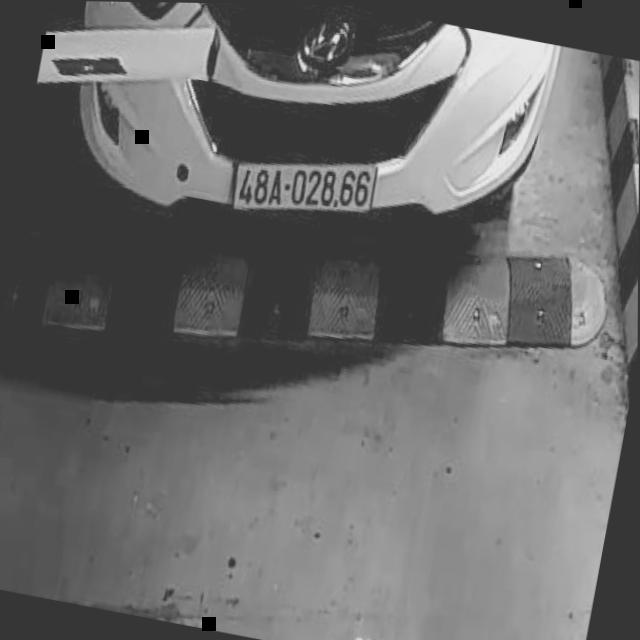

In [6]:
#DATA VERIFICATION
file_path = image_path[7] #path of our image N2.jpeg
img = cv2.imread(file_path) #read the image
# xmin-1804/ymin-1734/xmax-2493/ymax-1882 
img = io.imread(file_path) #Read the image
fig = px.imshow(img)
fig.update_layout(width=600, height=500, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure with bounding box')
fig.add_shape(type='rect',x0=1804, x1=2493, y0=1734, y1=1882, xref='x', yref='y',line_color='cyan')

In [7]:
#DATA PROCESSING
labels = df.iloc[:,1:1000].values
data = []
output = []
for ind in range(len(image_path)):
    image = image_path[ind]
    img_arr = cv2.imread(image)
    h,w,d = img_arr.shape
    # Prepprocesing
    load_image = load_img(image,target_size=(224,224))
    load_image_arr = img_to_array(load_image)
    norm_load_image_arr = load_image_arr/255.0 # Normalization
    # Normalization to labels
    xmin,xmax,ymin,ymax = labels[ind]
    nxmin,nxmax = xmin/w,xmax/w
    nymin,nymax = ymin/h,ymax/h
    label_norm = (nxmin,nxmax,nymin,nymax) # Normalized output
    # Append
    data.append(norm_load_image_arr)
    output.append(label_norm)

In [8]:
# Convert data to array
X = np.array(data,dtype=np.float32)
y = np.array(output,dtype=np.float32)

In [9]:
# Split the data into training and testing set using sklearn.
x_train,x_test,y_train,y_test = train_test_split(X,y,train_size=0.8,random_state=0)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((1600, 224, 224, 3), (401, 224, 224, 3), (1600, 4), (401, 4))

In [10]:
# parsing
def parsing(path):
    parser = xet.parse(path).getroot()
    name = parser.find('filename').text
    filename = f'/kaggle/input/license-plate-dataset/train/{name}'

    # width and height
    parser_size = parser.find('size')
    width = int(parser_size.find('width').text)
    height = int(parser_size.find('height').text)
    
    return filename, width, height
df[['filename','width','height']] = df['filepath'].apply(parsing).apply(pd.Series)
df.head()

,filepath,xmin,xmax,ymin,ymax,filename,width,height
0,/kaggle/input/license-plate-dataset/train/xema...,240,374,256,413,/kaggle/input/license-plate-dataset/train/xema...,640,640
1,/kaggle/input/license-plate-dataset/train/pic_...,246,397,280,406,/kaggle/input/license-plate-dataset/train/pic_...,640,640
2,/kaggle/input/license-plate-dataset/train/xema...,313,440,196,355,/kaggle/input/license-plate-dataset/train/xema...,640,640
3,/kaggle/input/license-plate-dataset/train/xema...,278,415,124,319,/kaggle/input/license-plate-dataset/train/xema...,640,640
4,/kaggle/input/license-plate-dataset/train/CarL...,97,238,410,487,/kaggle/input/license-plate-dataset/train/CarL...,640,640


In [11]:
df['center_x'] = (df['xmax'] + df['xmin'])/(2*df['width'])
df['center_y'] = (df['ymax'] + df['ymin'])/(2*df['height'])

df['bb_width'] = (df['xmax'] - df['xmin'])/df['width']
df['bb_height'] = (df['ymax'] - df['ymin'])/df['height']
df.head()

,filepath,xmin,xmax,ymin,ymax,filename,width,height,center_x,center_y,bb_width,bb_height
0,/kaggle/input/license-plate-dataset/train/xema...,240,374,256,413,/kaggle/input/license-plate-dataset/train/xema...,640,640,0.479687,0.522656,0.209375,0.245312
1,/kaggle/input/license-plate-dataset/train/pic_...,246,397,280,406,/kaggle/input/license-plate-dataset/train/pic_...,640,640,0.502344,0.535937,0.235937,0.196875
2,/kaggle/input/license-plate-dataset/train/xema...,313,440,196,355,/kaggle/input/license-plate-dataset/train/xema...,640,640,0.588281,0.430469,0.198437,0.248438
3,/kaggle/input/license-plate-dataset/train/xema...,278,415,124,319,/kaggle/input/license-plate-dataset/train/xema...,640,640,0.541406,0.346094,0.214062,0.304688
4,/kaggle/input/license-plate-dataset/train/CarL...,97,238,410,487,/kaggle/input/license-plate-dataset/train/CarL...,640,640,0.261719,0.700781,0.220312,0.120313


In [12]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15393, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 15393 (delta 9), reused 16 (delta 6), pack-reused 15369
Receiving objects: 100% (15393/15393), 14.37 MiB | 25.25 MiB/s, done.
Resolving deltas: 100% (10519/10519), done.


In [13]:
!pip install -r ./yolov5/requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 33.9 MB/s eta 0:00:00
  Attempting uninstall: setuptools
    Found existing installation: setuptools 59.8.0
    Uninstalling setuptools-59.8.0:
      Successfully uninstalled setuptools-59.8.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cudf 21.12.2 requires cupy-cuda115, which is not installed.
cudf 21.12.2 requires cupy-cuda115, which is not installed.
tensorflow 2.11.0 requires protobuf<3.20,>=3.9.2, but you have protobuf 3.20.3 which is incompatible.
tensorflow-transform 1.12.0 requires pyarrow<7,>=6, but you have pyarrow 5.0.0 which is incompatible.
tensorflow-serving-api 2.11.0 requires protobuf<3.20,>=3.9.2, but you have protobuf 3.20.3 which is incompatible.
librosa 0.10.0.post2 requires soundfile>=0.12.1, but you have soundfile 0.11.0 which is incompatible.
distributed 2021.11.2 requires

In [14]:
mkdir /kaggle/working/yolov5/data_images/

In [15]:
mkdir /kaggle/working/yolov5/data_images/test/

In [16]:
mkdir /kaggle/working/yolov5/data_images/train/

In [17]:
### split the data into train and test
df_train = df.iloc[:1600]
df_test = df.iloc[1600:]

In [18]:
train_folder = './yolov5/data_images/train'

values = df_train[['filename','center_x','center_y','bb_width','bb_height']].values
for fname, x,y, w, h in values:
    image_name = os.path.split(fname)[-1]
    txt_name = os.path.splitext(image_name)[0]
    
    dst_image_path = os.path.join(train_folder,image_name)
    dst_label_file = os.path.join(train_folder,txt_name+'.txt')
    
    # copy each image into the folder
    copy(fname,dst_image_path)

    # generate .txt which has label info
    label_txt = f'0 {x} {y} {w} {h}'
    with open(dst_label_file,mode='w') as f:
        f.write(label_txt)
        
        f.close()

test_folder = './yolov5/data_images/test'

values = df_test[['filename','center_x','center_y','bb_width','bb_height']].values
for fname, x,y, w, h in values:
    image_name = os.path.split(fname)[-1]
    txt_name = os.path.splitext(image_name)[0]
    
    dst_image_path = os.path.join(test_folder,image_name)
    dst_label_file = os.path.join(test_folder,txt_name+'.txt')
    
    # copy each image into the folder
    copy(fname,dst_image_path)

    # generate .txt which has label info
    label_txt = f'0 {x} {y} {w} {h}'
    with open(dst_label_file,mode='w') as f:
        f.write(label_txt)
        
        f.close()

In [19]:
import yaml
yaml_dict = {'train': 'data_images/train',   # path to the train folder
            'val': 'data_images/test', # path to the val folder
            'nc': 1,                             # number of classes
            'names': ['liscence_plate']}                # list of label names

with open(r'./yolov5/data.yaml', 'w') as file:
    documents = yaml.dump(yaml_dict, file)

In [20]:
!nvidia-smi

Wed Apr 12 18:38:00 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.161.03   Driver Version: 470.161.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [21]:
!pip install torch

In [22]:
!pip install GPUtil

  Preparing metadata (setup.py) ... - done
  Created wheel for GPUtil: filename=GPUtil-1.4.0-py3-none-any.whl size=7392 sha256=f44691db30b7a4e323dce77bd7b5ec83e32be93874624c1ff13bcba65556dc03
  Stored in directory: /root/.cache/pip/wheels/b1/e7/99/2b32600270cf23194c9860f029d3d5db075f250bc39028c045
Successfully built GPUtil


In [23]:


import torch
from GPUtil import showUtilization as gpu_usage
from numba import cuda

def free_gpu_cache():
    print("Initial GPU Usage")
    gpu_usage()                             

    torch.cuda.empty_cache()

    cuda.select_device(0)
    cuda.close()
    cuda.select_device(0)

    print("GPU Usage after emptying the cache")
    gpu_usage()

free_gpu_cache()  

Initial GPU Usage
| ID | GPU | MEM |
------------------
|  0 |  0% |  0% |
GPU Usage after emptying the cache
| ID | GPU | MEM |
------------------
|  0 |  9% |  2% |


In [24]:
!python ./yolov5/train.py --data ./yolov5/data.yaml --cfg ./yolov5/models/yolov5s.yaml --batch-size 20 --name Model --epochs 10

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5/yolov5s.pt, cfg=./yolov5/models/yolov5s.yaml, data=./yolov5/data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=20, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=Model, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=lat

In [25]:
# import onnx
# from onnx import utils

# model = onnx.load('model.onnx')
# model = utils.backward_compatible(model, target_version=11)
# onnx.save(model, 'model_v11.onnx')


In [26]:
!python ./yolov5/export.py --weight ./yolov5/runs/train/Model/weights/best.pt --include torchscript onnx

export: data=yolov5/data/coco128.yaml, weights=['./yolov5/runs/train/Model/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx']
YOLOv5 🚀 v7.0-140-g1db9533 Python-3.7.12 torch-1.13.0 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from yolov5/runs/train/Model/weights/best.pt with output shape (1, 25200, 6) (13.8 MB)

TorchScript: starting export with torch 1.13.0...
TorchScript: export success ✅ 2.2s, saved as yolov5/runs/train/Model/weights/best.torchscript (27.2 MB)

ONNX: starting export with onnx 1.13.1...
ONNX: export success ✅ 1.0s, saved as yolov5/runs/train/Model/weights/best.onnx (27.2 MB)

Export complete (4.2s)
Results saved to /kaggle/w

In [27]:
!python ./yolov5/export.py --weights ./yolov5/runs/train/Model/weights/best.pt --include torchscript onnx --opset 11


export: data=yolov5/data/coco128.yaml, weights=['./yolov5/runs/train/Model/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=11, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx']
YOLOv5 🚀 v7.0-140-g1db9533 Python-3.7.12 torch-1.13.0 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from yolov5/runs/train/Model/weights/best.pt with output shape (1, 25200, 6) (13.8 MB)

TorchScript: starting export with torch 1.13.0...
TorchScript: export success ✅ 2.5s, saved as yolov5/runs/train/Model/weights/best.torchscript (27.2 MB)

ONNX: starting export with onnx 1.13.1...
ONNX: export success ✅ 1.0s, saved as yolov5/runs/train/Model/weights/best.onnx (27.2 MB)

Export complete (4.6s)
Results saved to /kaggle/w

In [28]:
#predictions

INPUT_WIDTH =  640
INPUT_HEIGHT = 640


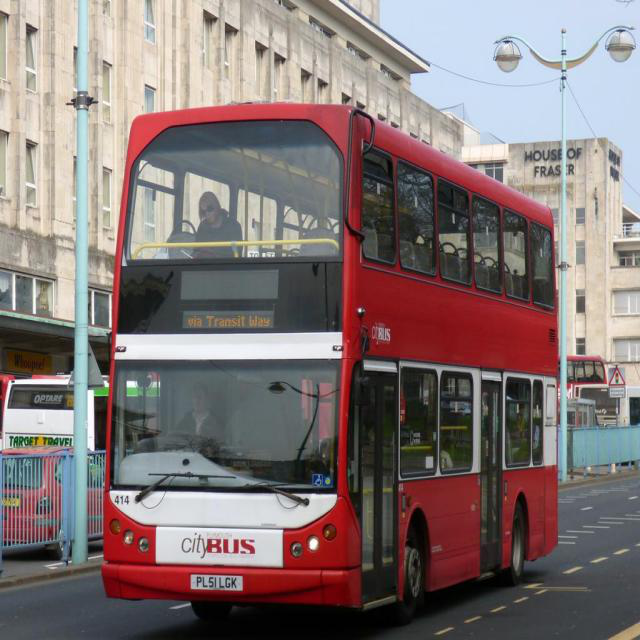

In [29]:
# LOAD THE IMAGE
img = io.imread('/kaggle/input/license-plate-dataset/test/008e36a5a0623445_jpg.rf.c0df6282d2fe4484c4c6de82acbb2ab5.jpg')

fig = px.imshow(img)
fig.update_layout(width=700, height=400, margin=dict(l=10, r=10, b=10, t=10))
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
fig.show()

In [30]:
# LOAD YOLO MODEL
net = cv2.dnn.readNetFromONNX('./yolov5/runs/train/Model/weights/best.onnx')
net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)

In [31]:
def get_detections(img,net):
    # 1.CONVERT IMAGE TO YOLO FORMAT
    image = img.copy()
    row, col, d = image.shape

    max_rc = max(row,col)
    input_image = np.zeros((max_rc,max_rc,3),dtype=np.uint8)
    input_image[0:row,0:col] = image

    # 2. GET PREDICTION FROM YOLO MODEL
    blob = cv2.dnn.blobFromImage(input_image,1/255,(INPUT_WIDTH,INPUT_HEIGHT),swapRB=True,crop=False)
    net.setInput(blob)
    preds = net.forward()
    detections = preds[0]
    
    return input_image, detections

def non_maximum_supression(input_image,detections):
    
    # 3. FILTER DETECTIONS BASED ON CONFIDENCE AND PROBABILIY SCORE
    
    # center x, center y, w , h, conf, proba
    boxes = []
    confidences = []

    image_w, image_h = input_image.shape[:2]
    x_factor = image_w/INPUT_WIDTH
    y_factor = image_h/INPUT_HEIGHT

    for i in range(len(detections)):
        row = detections[i]
        confidence = row[4] # confidence of detecting license plate
        if confidence > 0.4:
            class_score = row[5] # probability score of license plate
            if class_score > 0.25:
                cx, cy , w, h = row[0:4]

                left = int((cx - 0.5*w)*x_factor)
                top = int((cy-0.5*h)*y_factor)
                width = int(w*x_factor)
                height = int(h*y_factor)
                box = np.array([left,top,width,height])

                confidences.append(confidence)
                boxes.append(box)

    # 4.1 CLEAN
    boxes_np = np.array(boxes).tolist()
    confidences_np = np.array(confidences).tolist()
    
    # 4.2 NMS
    index = cv2.dnn.NMSBoxes(boxes_np,confidences_np,0.25,0.45)
    
    return boxes_np, confidences_np, index

def drawings(image,boxes_np,confidences_np,index):
    # 5. Drawings
    texts = []
    for ind in index:
        x,y,w,h =  boxes_np[ind]
        bb_conf = confidences_np[ind]
        conf_text = 'plate: {:.0f}%'.format(bb_conf*100)
        license_text = extract_text(image,boxes_np[ind])
        texts.append(license_text)


        cv2.rectangle(image,(x,y),(x+w,y+h),(255,0,255),2)
        cv2.rectangle(image,(x,y-30),(x+w,y),(255,0,255),-1)
        cv2.rectangle(image,(x,y+h),(x+w,y+h+25),(0,0,0),-1)


        cv2.putText(image,conf_text,(x,y-10),cv2.FONT_HERSHEY_COMPLEX,0.7,(255,255,255),1)
        cv2.putText(image,license_text,(x,y+h+27),cv2.FONT_HERSHEY_COMPLEX,0.7,(0,255,0),1)

    return image, texts

In [32]:
# predictions flow with return result
def yolo_predictions(img,net):
    # step-1: detections
    input_image, detections = get_detections(img,net)
    # step-2: NMS
    boxes_np, confidences_np, index = non_maximum_supression(input_image, detections)
    # step-3: Drawings
    result_img, texts = drawings(img,boxes_np,confidences_np,index)
    return result_img, texts

In [33]:
# # extrating text
# def extract_text(image,bbox):
#     x,y,w,h = bbox
#     roi = image[y:y+h, x:x+w]
    
#     if 0 in roi.shape:
#         return 'no number'
    
#     else:
#         text = pt.image_to_string(roi)
#         text = text.strip()
        
#         return text
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

import easyocr

# initialize the EasyOCR reader
reader = easyocr.Reader(['bn'])

def extract_text(image,bbox):
    x,y,w,h = bbox
    roi = image[y:y+h, x:x+w]
    
    if 0 in roi.shape:
        return 'no number'
    
    else:
        # extract text using EasyOCR
        result = reader.readtext(roi)
        text = ' '.join([res[1] for res in result])
        text = text.strip()
        
        return text

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [34]:
# test
from PIL import Image
img = Image.open('/kaggle/input/car-plate-detection-bangla/images/car2.png')

import numpy as np
img = np.array(img)
results, texts = yolo_predictions(img, net)
texts


['ঢাকা ঘেট্রো-ষ ১৫-২৫১১']


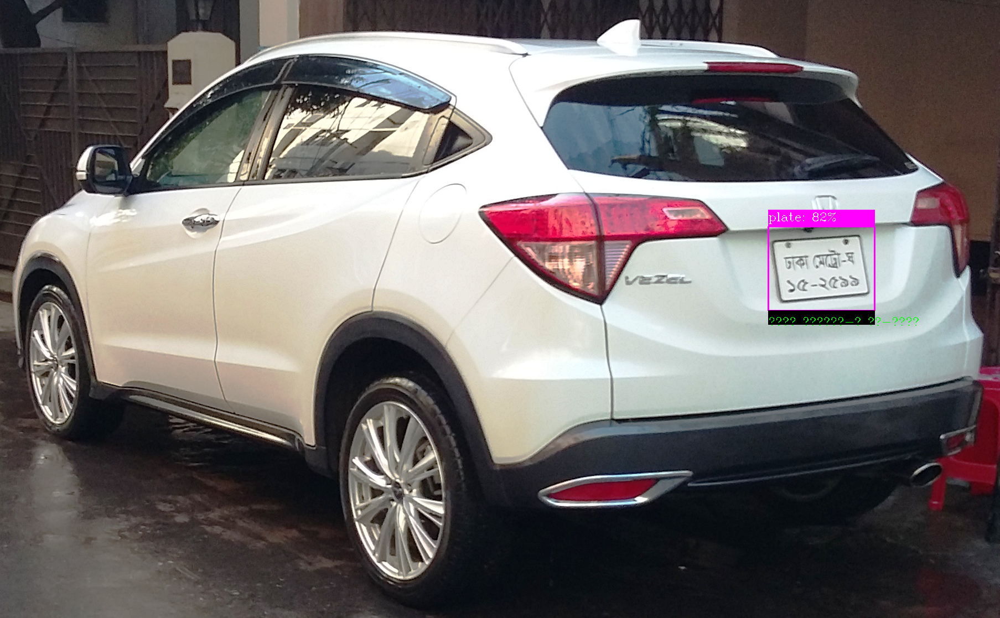

In [35]:
fig = px.imshow(img)
fig.update_layout(width=700, height=400, margin=dict(l=10, r=10, b=10, t=10))
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
fig.show()

In [36]:
!pip uninstall opencv-python-headless -y

Found existing installation: opencv-python-headless 4.5.4.60
Uninstalling opencv-python-headless-4.5.4.60:
  Successfully uninstalled opencv-python-headless-4.5.4.60


In [37]:
!pip install opencv-python --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.8/61.8 MB 19.2 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.5.4.60
    Uninstalling opencv-python-4.5.4.60:
      Successfully uninstalled opencv-python-4.5.4.60


[]


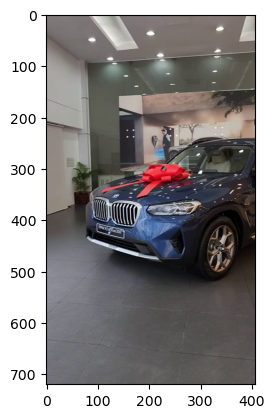

[]


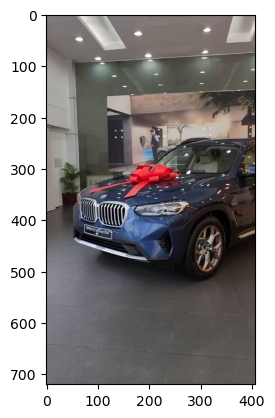

[]


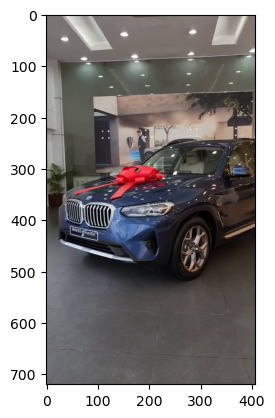

['']


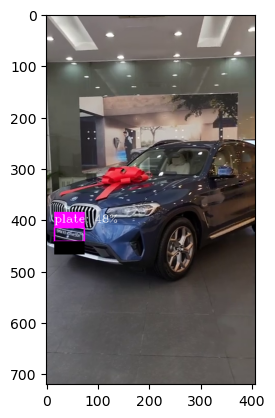

['']


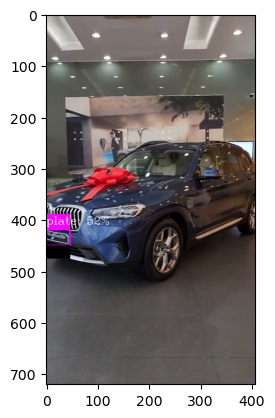

[]


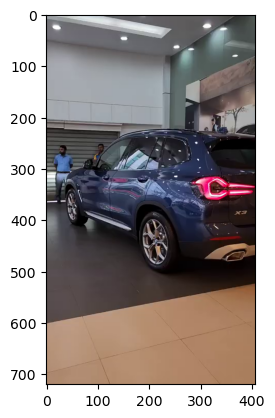

[]


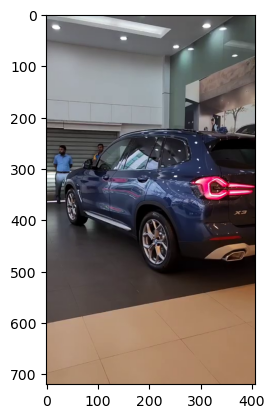

[]


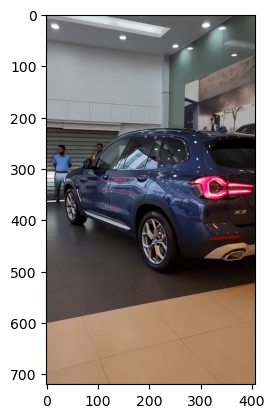

[]


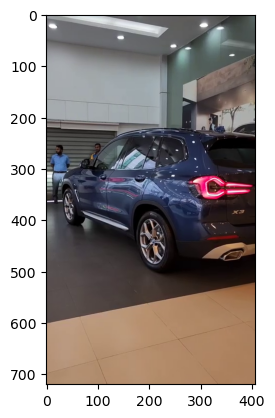

[]


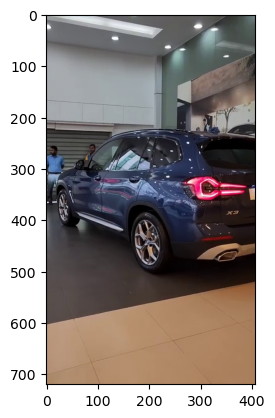

[]


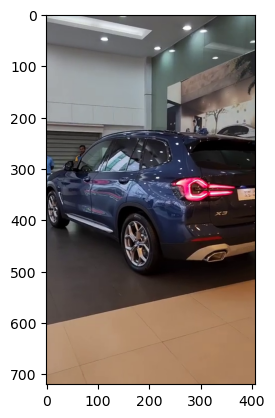

[]


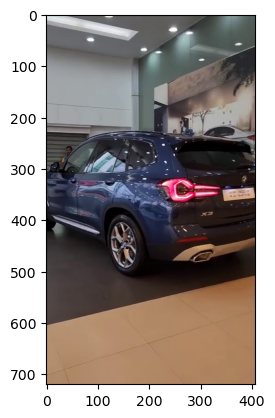

[]


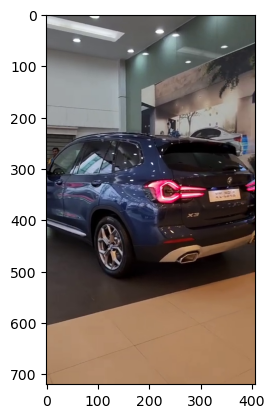

['']


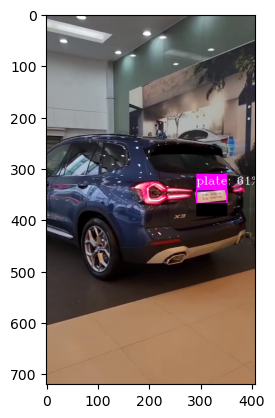

['']


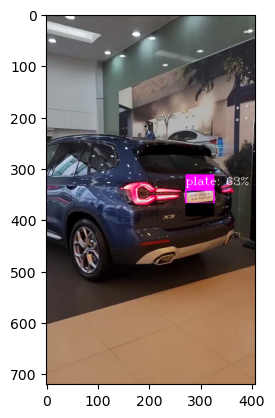

['']


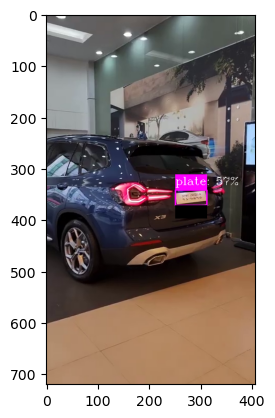

['গেণ্ডরী \' 58"2 তাবা']


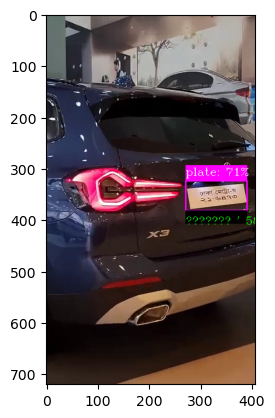

['মে৫ডে ২১-৬৪ ঢাকা']


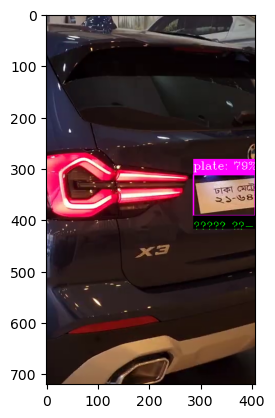

['ঢাকা মেট্রেো ২১-৬৪']


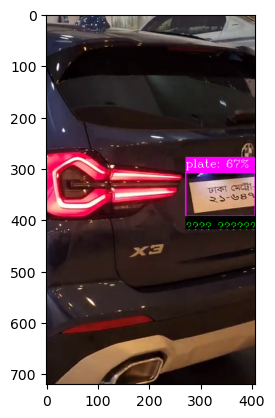

[]


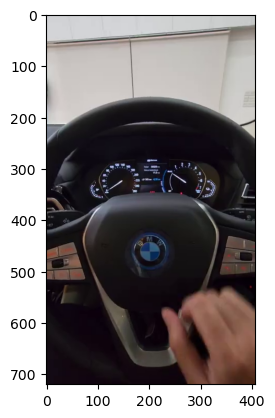

[]


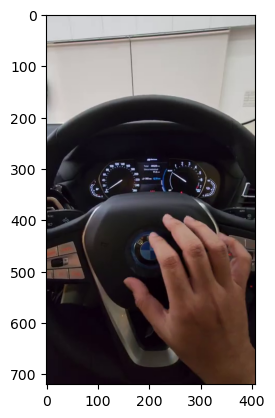

[]


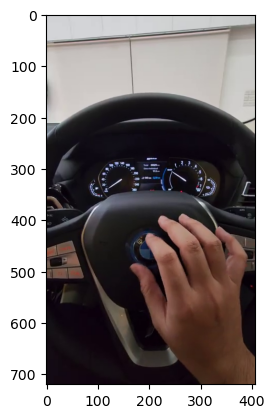

[]


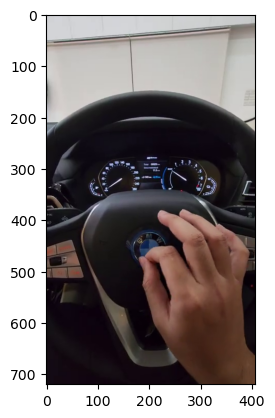

[]


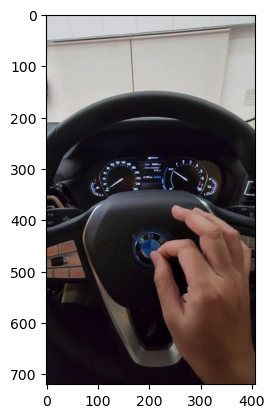

[]


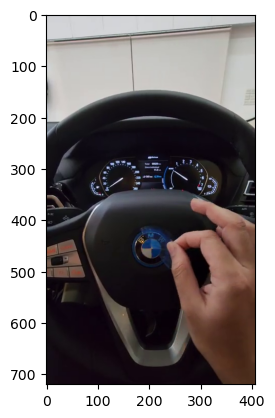

[]


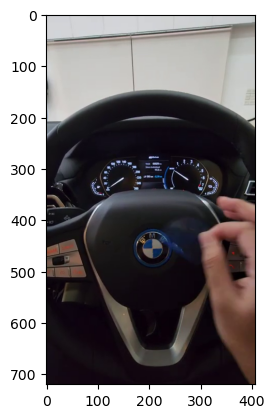

[]


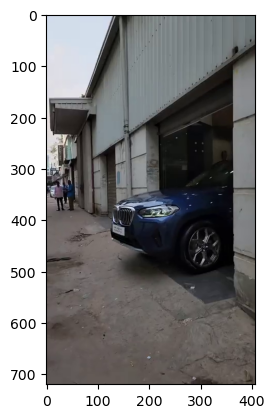

[]


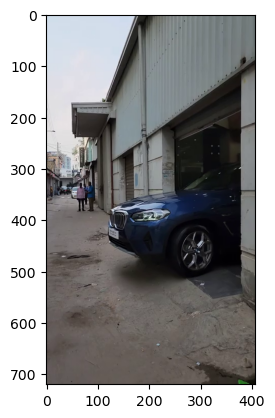

[]


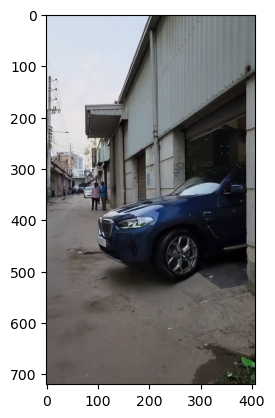

[]


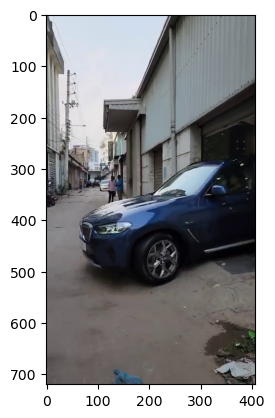

[]


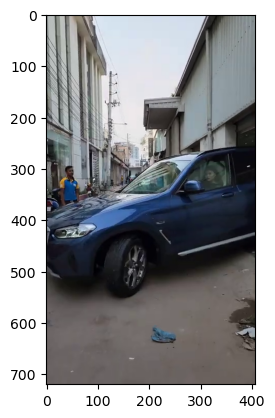

[]


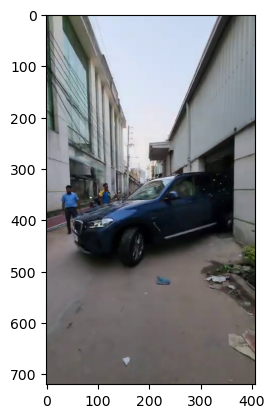

[]


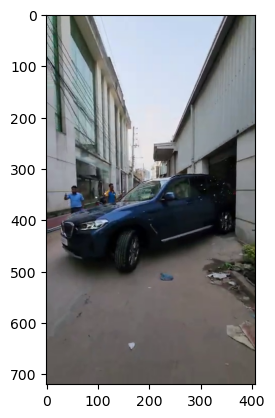

[]


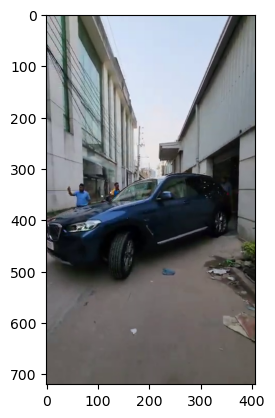

[]


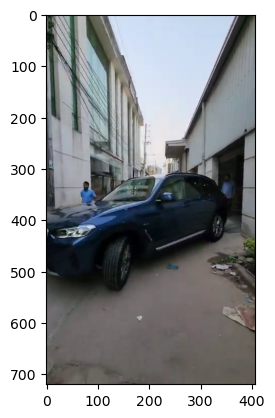

[]


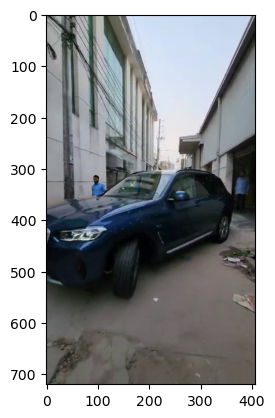

[]


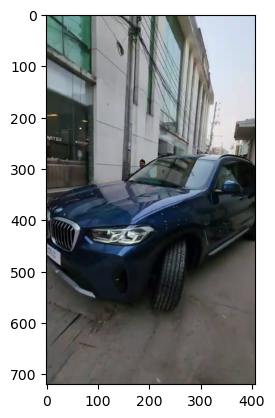

[]


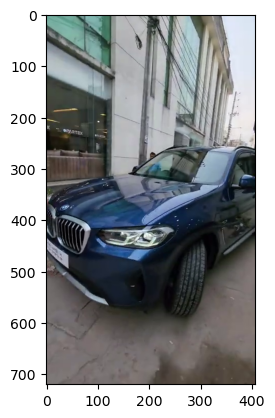

['']


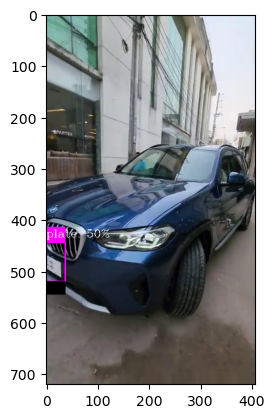

[]


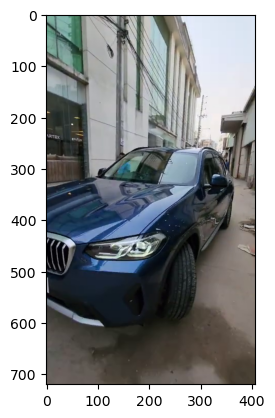

Unable to read video


<Figure size 640x480 with 0 Axes>

In [38]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

cap = cv2.VideoCapture('/kaggle/input/car-plate-detection-bangla/bd_bmw_video.mp4')
while True:
    ret, frame = cap.read()

    if ret == False:
        print('Unable to read video')
        break
        
    for i in range(10):
        ret = cap.grab()
    
#     frame = denoise_img(frame)
#     increase_contrast(frame)
    results, texts = yolo_predictions(frame,net)
    print(texts)

    results = np.array(results)  # Convert to numpy array
    results = cv2.cvtColor(results, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB format

    plt.imshow(results)
    plt.show(block=False)
    plt.pause(0.03)
    plt.clf()

    if plt.waitforbuttonpress(30/1000):
        break

cap.release()


In [39]:
def denoise_img(img):
    new_img = cv2.fastNlMeansDenoising(img, None, 10, 7, 21)
    plt.imshow(new_img)
    plt.show(block=False)
    plt.pause(0.03)
    plt.clf()
    return new_img

def increase_contrast(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#     cv2.imshow('Original Image', gray)
    new_img = cv2.equalizeHist(img)
    cv2.imshow('Equalized Image', img)
    cv2.imshow('New Image', new_img)
    cv2.waitKey(0)
    
    